<a href="https://colab.research.google.com/github/RISHI4440/Data-Mining-Projects/blob/main/Vacant_%26_Abandoned_Building_in_Chicago_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Data Mining Vacant and Abandoned Buildings in Chicago**

*by Rushikesh R. Shirsat*

**Introduction:**
In any urban center across the globe, Vacant and Abandoned buildings present significant challenges, such as contributing to urban decay posing safety risks, and reducing property values. In response to these challenges, my proposed data mining project aims to unravel the complex narrative of vacant and abandoned buildings in Chicago, focusing on their impact on Housing Quality and finding Vacant properties owned by Individuals and Corporations. I am planning to do it by leveraging a comprehensive dataset provided by Chicago’s Administrative Hearings and Finance Dept.

**Dataset Description and Significance:**
The dataset at the heart of this project comprises detailed records of violations related to vacant and abandoned buildings, as reported by the Chicago administration. Each record in the dataset includes several key columns including Docket and Violation Numbers, Issued Date and Last Hearing Date, Issuing Department, Property Address, Violation Type, Entity or Person(s), Disposition Description, Financial s, and Geospatial Data. This dataset is significant for its depth and breadth, offering a rich foundation for analysis.

https://data.cityofchicago.org/Buildings/Vacant-and-Abandoned-Buildings-Violations/kc9i-wq85/about_data

**Story to Tell and Importance:**
This project aims to unravel the complex narrative of vacant and abandoned buildings in Chicago, focusing on their impact on Housing Quality and analyzing vacant properties owned by Individuals and Corporate Companies. Moreover, by leveraging geospatial data, we can determine how these neglected properties contribute to the degradation of surrounding housing, while also exploring ownership patterns to understand their role in urban decay.

**IMPORTING THE 1ST DATASET FOR VACANT & ABANDONED BUILDING IN CHICAGO**

In [ ]:
# Import modules.
#!pip install pandas requests
#!pip install folium


import requests
import pandas as pd
import matplotlib.pyplot as plt


# Setting endpoint and App Token
#dataset_id = "kc9i-wq85"

base_url = f"https://data.cityofchicago.org/resource/kc9i-wq85.json"
#app_token = "_app_token_here"

# Setup query parameters for filtering, selecting specific columns, etc.
params = {
    "$limit": 5000,  # how many rows you want to fetch
   # "$$app_token": app_token
}

# API request
response = requests.get(base_url, params=params)

# Check if the request was successful
if response.status_code == 200:
    # Load the response JSON into a DataFrame
    df_master = pd.read_json(response.text)

    # Display the first few rows of the DataFrame
    print(df_master.head())
else:
    print(f"Failed to fetch data: {response.status_code}")

<ipython-input-1-aae6bb746c03>:29: FutureWarning: Passing literal json to 'read_json' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  df_master = pd.read_json(response.text)


  docket_number                  violation_number              issued_date  \
0    11CP015666             P002161520|P002161521  2011-03-07T00:00:00.000   
1    11CP020396                        P002513827  2011-05-04T00:00:00.000   
2    11CP024049             P002165386|P002165387  2011-05-03T00:00:00.000   
3    11CP026554                        P002109256  2011-05-27T00:00:00.000   
4    11CP054441  P003018262|P003018263|P003018264  2011-08-25T00:00:00.000   

  issuing_department        last_hearing_date  property_address  \
0             POLICE  2011-08-05T11:00:00.000   9332 S LASALLE    
1             POLICE  2011-07-01T14:30:00.000    2107 N SAWYER    
2             POLICE  2011-07-01T14:00:00.000   12863 S NORMAL    
3             POLICE  2011-07-01T09:00:00.000  5700 S ABERDEEN    
4             POLICE  2011-10-07T09:00:00.000    5035 S RACINE    

                                      violation_type  \
0  13-12-125  Duty to secure and maintain vacant ...   
1               

**DATA FILTERING BY ELIMINATING ROWS WITH MISSING DATA IN DATAFRAME_1**

In [ ]:
df_working = df_master.copy() #Creating a Master and working DF


expected_rows = 5000  # expected number of rows
actual_rows = df_working.shape[0]

if actual_rows != expected_rows:
    print(f"discrepancy founded: Expected {expected_rows}, found {actual_rows}")
    # Investigate and fix the issue, possibly related to data fetching limits or errors.

# Inspecting Missing data
#missing_data = df_working.isnull()
missing_data = df_working.isnull().sum()
print(missing_data[missing_data > 0])  # Prints columns with missing values and their count

#eliminate rows with missing data
df_working.dropna(inplace=True)


latitude                       291
longitude                      291
location                       291
:@computed_region_rpca_8um6    291
:@computed_region_vrxf_vc4k    291
:@computed_region_6mkv_f3dw    291
:@computed_region_bdys_3d7i    291
:@computed_region_43wa_7qmu    291
dtype: int64


**CLEANING THE DATA AND REMOVING EXTRA COLOUMS**

In [ ]:
#df_cleaned


# List of columns to be eliminated
columns_to_drop1 = [':@computed_region_rpca_8um6',
                   ':@computed_region_vrxf_vc4k',
                   ':@computed_region_6mkv_f3dw',
                   ':@computed_region_bdys_3d7i',
                   ':@computed_region_43wa_7qmu',
                   'current_amount_due','total_fines','interest_amount','total_administrative_costs','collection_costs_or_attorney_fees','original_total_amount_due']

df_cleaned_1 = df_master.drop(columns=columns_to_drop1)

print(" \n")

print(" Display the DataFrame after Dropping Multiple Unnecessary coloums \n")

# Display the DataFrame after Dropping Multiple Unnecessary coloums
# print(df_working2_clean)
df_cleaned_1

 

 Display the DataFrame after Dropping Multiple Unnecessary coloums 



,docket_number,violation_number,issued_date,issuing_department,last_hearing_date,property_address,violation_type,entity_or_person_s_,disposition_description,court_cost,total_paid,latitude,longitude,location
0,11CP015666,P002161520|P002161521,2011-03-07T00:00:00.000,POLICE,2011-08-05T11:00:00.000,9332 S LASALLE,13-12-125 Duty to secure and maintain vacant ...,"JP MORGAN CHASE,",City Non suit - Motion to set-aside default - ...,0.00,0.00,41.724332,-87.627669,"{'type': 'Point', 'coordinates': [-87.62766855..."
1,11CP020396,P002513827,2011-05-04T00:00:00.000,POLICE,2011-07-01T14:30:00.000,2107 N SAWYER,13-12-140 Watchman required,"DEUTSCHE BANK,",Liable - By plea,0.00,280.00,41.919469,-87.708844,"{'type': 'Point', 'coordinates': [-87.70884424..."
2,11CP024049,P002165386|P002165387,2011-05-03T00:00:00.000,POLICE,2011-07-01T14:00:00.000,12863 S NORMAL,13-12-125 Duty to secure and maintain vacant ...,"WELLS FARGO BANK NA,",City non-suit,0.00,0.00,41.659662,-87.633937,"{'type': 'Point', 'coordinates': [-87.63393730..."
3,11CP026554,P002109256,2011-05-27T00:00:00.000,POLICE,2011-07-01T09:00:00.000,5700 S ABERDEEN,13-12-140 Watchman required,"OCWEN LOAN SERVICING LLC,",Not liable - City failed to meet burden of proof,26.09,1125.00,41.790474,-87.652497,"{'type': 'Point', 'coordinates': [-87.65249718..."
4,11CP054441,P003018262|P003018263|P003018264,2011-08-25T00:00:00.000,POLICE,2011-10-07T09:00:00.000,5035 S RACINE,13-12-140 Watchman required|13-12-140 Watchm...,"WELLS FARGO,",City non-suit,0.00,0.00,41.802223,-87.654932,"{'type': 'Point', 'coordinates': [-87.65493156..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,12CP029616,P003088983,2012-04-14T00:00:00.000,POLICE,2012-06-01T11:00:00.000,7633 S MORGAN,13-12-125 Duty to secure and maintain vacant ...,"FEDERAL HOME MORTGAGE,",City non-suit,0.00,441.33,41.755038,-87.648862,"{'type': 'Point', 'coordinates': [-87.64886187..."
4996,13CP006232,P003831726|P003831727|P003831728|P003831729|P0...,2013-01-18T00:00:00.000,POLICE,2013-04-05T09:00:00.000,4528 S RICHMOND,13-12-125 Duty to secure and maintain vacant ...,"DEUTSCHE BANK AND TRUST,",City Non suit - Motion to set-aside default - ...,0.00,0.00,41.810971,-87.698105,"{'type': 'Point', 'coordinates': [-87.69810535..."
4997,13CP075669,P004319978|P004319988|P004319989|P004319990|P0...,2013-08-26T00:00:00.000,POLICE,2013-10-04T09:00:00.000,2445 W 69TH,13-12-125 Duty to secure and maintain vacant ...,"BANK OF AMERICA,",City non-suit,0.00,0.00,41.768197,-87.685129,"{'type': 'Point', 'coordinates': [-87.68512937..."
4998,16CP013967,P004965221|P004965222|P004965223|P004965224|P0...,2016-02-24T00:00:00.000,POLICE,2016-04-01T09:00:00.000,6208 S MORGAN,13-12-125 Duty to secure and maintain vacant ...,"CHASE REO GROUP LLC,",Default - Liable by prove-up,0.00,0.00,41.781173,-87.649829,"{'type': 'Point', 'coordinates': [-87.64982927..."


**Total No of Abandoned Buildings Over Time**

Following graph represents Number of Vacant and Abandoned building over the time of period from 2002 to 2023

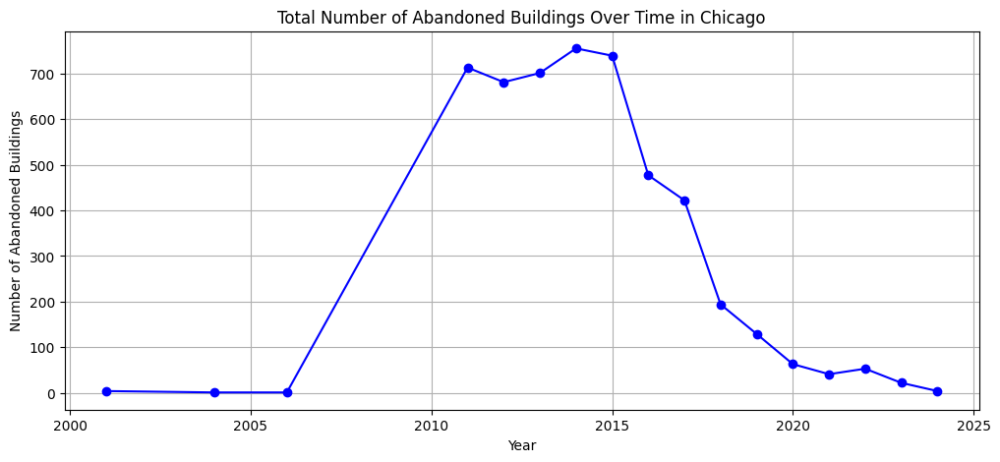

In [ ]:
# Convert 'issued_date' to datetime format
df_cleaned_1['issued_date'] = pd.to_datetime(df_cleaned_1['issued_date'])

# Extract the year from 'issued_date' and create new column
df_cleaned_1['year'] = df_cleaned_1['issued_date'].dt.year

# Group by the new 'year' column and count no of entries for each year
abandoned_buildings_per_year = df_cleaned_1.groupby('year').size()

# Graphs
plt.figure(figsize=(12, 5))  # Set the figure siz
plt.plot(abandoned_buildings_per_year.index, abandoned_buildings_per_year.values, marker='o', linestyle='-', color='b')
plt.title('Total Number of Abandoned Buildings Over Time in Chicago')
plt.xlabel('Year')
plt.ylabel('Number of Abandoned Buildings')
plt.grid(True)  # Add grid lines for
#plr.
#plt.xticks(rotation=45)  # Rotate the x-axis labels
#plt.tight_layout()  # Adjust the layout to make room
plt.show()

**Heatmaps Visualizing Density and Impact of Vacant & Abandoned Buildings in Chicago area**

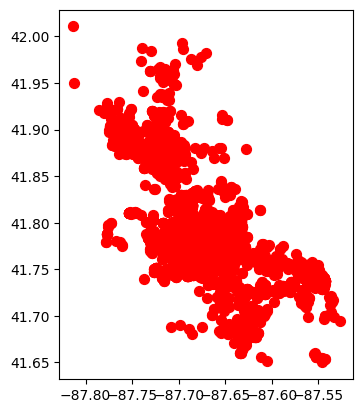

In [ ]:
import geopandas as gpd
from shapely.geometry import Point
#Create a Geospatial Map
gdf = gpd.GeoDataFrame(df_cleaned_1, geometry=gpd.points_from_xy(df_cleaned_1.longitude, df_cleaned_1.latitude))
gdf.plot(marker='o', color='red', markersize=50)
plt.show()
#Create a Geospatial Map

**Locating Vacant & Abandoned Building on Chicago map**

 To see more detail can click on any mark on the map to view the address of the building. This interactive aspect is invaluable for urban planners and community groups, allowing them to pinpoint specific areas for intervention and urban renewal efforts effectively. It also helps in monitoring the progress of these initiatives over time, ensuring resources are targeted efficiently to revitalize neighborhoods and mitigate associated socio-economic issues.

 Please zoom in so additonal markes representing properties will become visible

In [ ]:
import folium
from folium.plugins import MarkerCluster

df_map_1 = df_cleaned_1.dropna(subset=['latitude', 'longitude'])
map_center = [df_map_1['latitude'].mean(), df_map_1['longitude'].mean()]

m = folium.Map(location=map_center, zoom_start=12 )

marker_cluster = MarkerCluster().add_to(m)

for idx, row in df_map_1.iterrows():
    folium.Marker(
        [row['latitude'], row['longitude']],
        popup=f"<strong>Property Address:</strong> {row['property_address']}"
    ).add_to(marker_cluster)

m

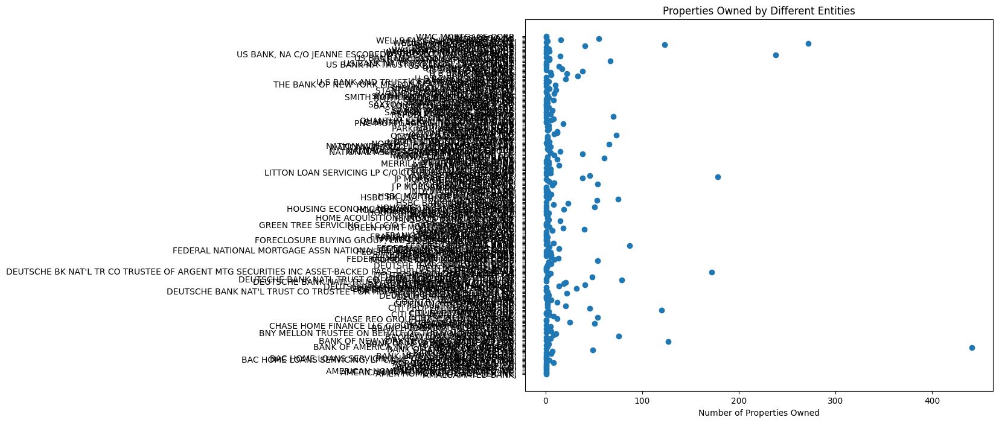

In [ ]:
### Step 2: Plotting
# bar chart
property_counts = df_cleaned_1.groupby('entity_or_person_s_')['docket_number'].nunique()
property_counts_df = property_counts.reset_index(name='num_properties')
property_counts_df['entity_id'] = range(1, len(property_counts_df) + 1)

# Plotting
plt.figure(figsize=(10, 8))
plt.scatter(property_counts_df['num_properties'], property_counts_df['entity_id'])

plt.yticks(property_counts_df['entity_id'], property_counts_df['entity_or_person_s_'])

plt.xlabel('Number of Properties Owned')
plt.title('Properties Owned by Different Entities')

plt.grid(False)
plt.show()

**Properties Owned by Corporate vs. Individuals**

Following graph represent no of Vacant & Abandoned Building owned by Individuals and Corportate Companies

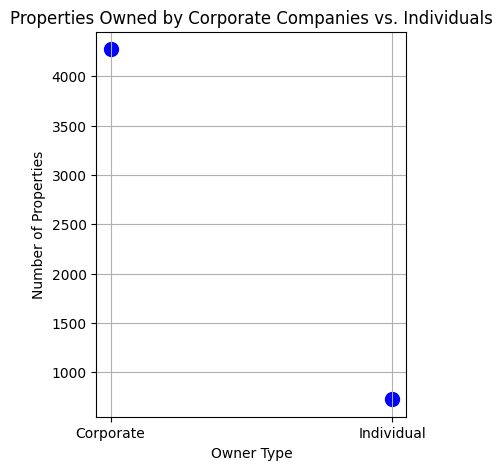

In [ ]:
# Categorize each owner as 'Corporate' or 'Individual'
corporate_keywords = ['BANK', 'LLC', 'CORP', 'INC', 'COMPANY', 'FANNIE MAE']
df_cleaned_1['Owner Type'] = df_cleaned_1['entity_or_person_s_'].apply(lambda x: 'Corporate' if any(keyword in x.upper() for keyword in corporate_keywords) else 'Individual')

# Count the number of properties owned by each category
properties_by_owner_type = df_cleaned_1['Owner Type'].value_counts()

x = properties_by_owner_type.index
y = properties_by_owner_type.values

# Assign numeric values to x-axis categories for plotting
x_numeric = range(len(x))

plt.figure(figsize=(4, 5))
plt.scatter(x_numeric, y, color='blue', s=100)  # s is the size of points

plt.title('Properties Owned by Corporate Companies vs. Individuals')
plt.xlabel('Owner Type')
plt.ylabel('Number of Properties')
plt.xticks(x_numeric, x)

plt.grid(True)
plt.show()

**Maps for Visualizing Density and Impact of Vacant & Abandoned Buildings**

Heatmaps are a pivotal visualization tool for identifying and analyzing the density and impact of vacant and abandoned buildings in urban areas, like Chicago. By marking these locations with red markers on OpenStreetMap, heatmaps not only highlight concentrations of neglected properties but also offer interactive functionality.

In [ ]:
import folium


df_cleaned_1 = df_cleaned_1.dropna(subset=['latitude', 'longitude'])

# Calculate the center of the map after cleaning the data
map_center = [df_cleaned_1['latitude'].mean(), df_cleaned_1['longitude'].mean()]

# Create a Folium map centered on the calculated mean latitude and longitude
m = folium.Map(location=map_center, zoom_start=12)

# Iterate through the cleaned DataFrame and add CircleMarkers
for idx, row in df_cleaned_1.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color='red',
        fill=True,
        fill_color='red'
    ).add_to(m)

m

**Top Ten Entities with highest Number of Properties**

Following graph shows the top 10 Property owner of vacant and abandoned building in Chicago City

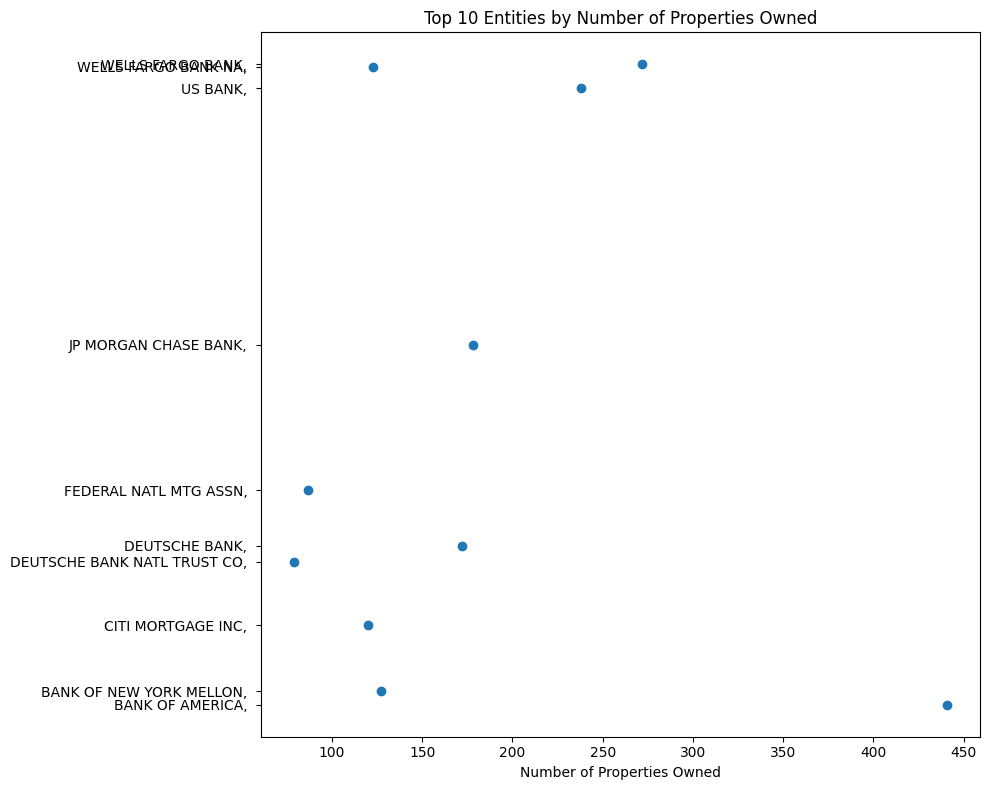

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Set N to the number of top entities you want to display
N = 10
top_property_counts_df = property_counts_df.sort_values(by='num_properties', ascending=False).head(N)

# Plotting
plt.figure(figsize=(10, 8))
plt.scatter(top_property_counts_df['num_properties'], top_property_counts_df['entity_id'])

plt.yticks(top_property_counts_df['entity_id'], top_property_counts_df['entity_or_person_s_'])

plt.xlabel('Number of Properties Owned')
plt.title(f'Top {N} Entities by Number of Properties Owned')

plt.grid(False)
plt.tight_layout()
plt.show()

**Milestone 3 Findings and Summery**

The analysis of the vacant and abandoned building dataset in Chicago from 2002 to 2023 reveals significant insights into the city's urban decay and housing quality issues. The number of vacant buildings was relatively low between 2002 and 2006 but began to increase sharply after 2006, reaching a peak in 2014. Fortunately, since 2015, there has been a steady decline in these numbers, suggesting improvements in urban management or changes in economic conditions.

A noteworthy finding from the dataset is that corporate ownership dominates individual ownership in these properties, with major banks like Bank of America, US Bank, and JP Morgan Chase being the top owners. This pattern points to the possible role of financial institutions in the proliferation and management of vacant properties.

Geographically, the vacant and abandoned buildings are predominantly found in the west and south sides of Chicago. Specifically, neighborhoods such as West and East Garfield Park, Humboldt Park, and North Lawndale in the west, and areas like Chatham Park, West Englewood, and along major streets like 119th and 83rd in the south, are most affected. These regions, historically underserved, continue to face challenges that are exacerbated by the presence of neglected properties, thereby influencing the overall housing quality and contributing to the ongoing urban decay.


This comprehensive analysis underscores the importance of targeted policy interventions and community engagement to address the root causes of property abandonment and its cascading effects on community health and safety.


#**MILESTONE 4**

**INTRODUCTION**

- The 2nd Dataset we are using is CDPH Environmental Complaints https://data.cityofchicago.org/Environment-Sustainable-Development/CDPH-Environmental-Complaints/fypr-ksnz/about_data



- CDPH complaint types are “Abandoned Site”, “Air Pollution Work Order”, “Asbestos Work Order”, “Construction and Demolition”, “Toxics Hazardous Materials Work Order”, ”Illegal Dumping Work Order”, “Noise Complaint”, “Permits Issued by DOE Work Order”, “Recycling Work Order”, “Service Stations/Storage Tanks Work Order”, “Vehicle Idling Work Order”, and “Water Pollution.”

- With Milestone 4 we are exploring the new dataset and trying to find correlation between Vacant & Abandoned Building and CDPH Environmental Complaints.



**Importing the CDPH Environmental Complaints Data from Chicago Data Portal**

- Here we are using socrata API without token

In [ ]:

import requests
import pandas as pd
import matplotlib.pyplot as plt


# Setting endpoint and App Token
#dataset_id = "kc9i-wq85"

base_url2 = "https://data.cityofchicago.org/resource/fypr-ksnz.json"
#app_token = "_app_token_here"

# Setup query parameters for filtering, selecting specific columns, etc.
params = {
    "$limit": 5000,  # how many rows you want to fetch
   # "$$app_token": app_token
}

# API request
response2 = requests.get(base_url2, params=params)

# Check if the request was successful
if response2.status_code == 200:
    # Load the response JSON into a DataFrame
    df_master2 = pd.read_json(response2.text)

    # Display the first few rows of the DataFrame
  #  print(df_master2.head())
else:
    print(f"Failed to fetch data: {response2.status_code}")

print("CDPH Environmental Complaints Data from Chicago: \n \n")

df_master2


CDPH Environmental Complaints Data from Chicago: 
 



,complaint_id,complaint_type,address,street_number,direction,street_name,street_type,inspector,complaint_date,inspection_log,...,modified_date,latitude,longitude,location,:@computed_region_rpca_8um6,:@computed_region_vrxf_vc4k,:@computed_region_6mkv_f3dw,:@computed_region_bdys_3d7i,:@computed_region_43wa_7qmu,complaint_detail
0,601575222,CONSTRUCTION AND DEMOLITION,1909 W OGDEN AVE,1909,W,OGDEN,AVE,379542,2024-07-12T00:00:00.000,[INSPECTION LOG #: 22435622 17-JUL-24 13:00:00...,...,2024-07-23T00:00:00.000,41.874463,-87.674190,"{'type': 'Point', 'coordinates': [-87.67418956...",28.0,29.0,21184.0,90.0,46.0,NaN
1,601579746,AIR POLLUTION WORK ORDER,942 E 55TH ST,942,E,55TH,ST,8386,2024-07-23T00:00:00.000,[INSPECTION LOG #: 22440988 23-JUL-24 15:05:00...,...,2024-07-23T00:00:00.000,41.795442,-87.602078,"{'type': 'Point', 'coordinates': [-87.60207807...",10.0,8.0,21192.0,440.0,33.0,NaN
2,601579359,AIR POLLUTION WORK ORDER,275 E CHESTNUT ST,275,E,CHESTNUT,ST,417337,2024-07-22T00:00:00.000,[INSPECTION LOG #: 22437360 22-JUL-24 13:15:00...,...,2024-07-23T00:00:00.000,41.898353,-87.618962,"{'type': 'Point', 'coordinates': [-87.61896201...",6.0,37.0,21182.0,233.0,11.0,NaN
3,601579752,AIR POLLUTION WORK ORDER,4014 S PULASKI RD,4014,S,PULASKI,RD,8386,2024-07-23T00:00:00.000,[INSPECTION LOG #: 22440320 23-JUL-24 14:10:00...,...,2024-07-23T00:00:00.000,41.819052,-87.724113,"{'type': 'Point', 'coordinates': [-87.72411270...",56.0,54.0,22248.0,591.0,8.0,NaN
4,601579308,AIR POLLUTION WORK ORDER,10837 S AVENUE F,10837,S,AVENUE F,NaN,13776,2024-07-22T00:00:00.000,[INSPECTION LOG #: 22439304 22-JUL-24 11:00:00...,...,2024-07-23T00:00:00.000,41.698070,-87.530309,"{'type': 'Point', 'coordinates': [-87.53030863...",25.0,49.0,21202.0,552.0,47.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,601131685,NOISE COMPLAINT,1944 N NARRAGANSETT AVE,1944,N,NARRAGANSETT,AVE,417325,2022-02-16T00:00:00.000,[INSPECTION LOG #: 16054674 18-FEB-22 09:15:00...,...,2022-02-18T00:00:00.000,41.915925,-87.785366,"{'type': 'Point', 'coordinates': [-87.78536600...",3.0,26.0,22615.0,598.0,7.0,NaN
4996,601131697,CONSTRUCTION AND DEMOLITION,506 W HARRISON ST,506,W,HARRISON,ST,425726,2022-02-16T00:00:00.000,[INSPECTION LOG #: 16044466 16-FEB-22 13:15:00...,...,2022-02-17T00:00:00.000,41.874512,-87.639865,"{'type': 'Point', 'coordinates': [-87.63986470...",44.0,29.0,14917.0,97.0,26.0,NaN
4997,601131986,VEHICLE IDLING WORK ORDER,3049 N ASHLAND AVE,3049,N,ASHLAND,AVE,426532,2022-02-17T00:00:00.000,[INSPECTION LOG #: 16047563 17-FEB-22 12:45:00...,...,2022-02-17T00:00:00.000,41.937508,-87.668436,"{'type': 'Point', 'coordinates': [-87.66843642...",22.0,57.0,4449.0,712.0,40.0,NaN
4998,601131748,AIR POLLUTION WORK ORDER,1110 N CALIFORNIA AVE,1110,N,CALIFORNIA,AVE,410716,2022-02-16T00:00:00.000,[INSPECTION LOG #: 16044271 16-FEB-22 14:00:00...,...,2022-02-17T00:00:00.000,41.901435,-87.696989,"{'type': 'Point', 'coordinates': [-87.69698914...",4.0,25.0,21560.0,301.0,49.0,NaN


**Creating a Master and working Data Frame**

- Finding and fixing data fetching limits / errors

- Counting missing columns and number of missing values

- eliminating rows with missing data / na


In [ ]:
df_working2 = df_master2.copy() #Creating a Master and working DF


print("Discrepancy founded in DATASET")

print(" \n")

expected_rows =2000  # expected number of rows
actual_rows = df_working2.shape[0]

if actual_rows != expected_rows:
    print(f"discrepancy founded: Expected {expected_rows}, found {actual_rows}")
    # Investigate and fix the issue, possibly related to data fetching limits or errors.

# Inspecting Missing data
#missing_data = df_working.isnull()
missing_data = df_working2.isnull().sum()
print(missing_data[missing_data > 0])  # Prints columns with missing values and their count

#eliminate rows with missing data
df_working2.dropna(inplace=True)



Discrepancy founded in DATASET
 

discrepancy founded: Expected 2000, found 5000
street_type                      93
latitude                          1
longitude                         1
location                          1
:@computed_region_rpca_8um6       1
:@computed_region_vrxf_vc4k       1
:@computed_region_6mkv_f3dw       1
:@computed_region_bdys_3d7i       1
:@computed_region_43wa_7qmu       1
complaint_detail               4735
dtype: int64


**DROPPING EXTRA COLUMNS FROM THE DATAFRAME**

- :@computed_region_rpca_8um6'
- :@computed_region_vrxf_vc4k',
- :@computed_region_6mkv_f3dw',
- :@computed_region_bdys_3d7i',
- :@computed_region_43wa_7qmu',
- complaint_detail',
- 'inspection_log',
- data_source'
- 'location'


In [ ]:
# List of columns to be eliminated
columns_to_drop = [':@computed_region_rpca_8um6',
                   ':@computed_region_vrxf_vc4k',
                   ':@computed_region_6mkv_f3dw',
                   ':@computed_region_bdys_3d7i',
                   ':@computed_region_43wa_7qmu',
                   'complaint_detail','inspection_log','data_source','location']

df_working2_clean = df_working2.drop(columns=columns_to_drop)

print(" \n")

print(" Display the DataFrame after Dropping Multiple Unnecessary coloums \n")

# Display the DataFrame after Dropping Multiple Unnecessary coloums
# print(df_working2_clean)
df_working2_clean

 

 Display the DataFrame after Dropping Multiple Unnecessary coloums 



,complaint_id,complaint_type,address,street_number,direction,street_name,street_type,inspector,complaint_date,modified_date,latitude,longitude
85,601572699,AIR POLLUTION WORK ORDER,10716 S YATES AVE,10716,S,YATES,AVE,10937,2024-07-09T00:00:00.000,2024-07-10T00:00:00.000,41.700507,-87.564138
992,601491847,AIR POLLUTION WORK ORDER,3200 S KILBOURN AVE,3200,S,KILBOURN,AVE,249349,2024-01-18T00:00:00.000,2024-02-09T00:00:00.000,41.834849,-87.736747
1091,601487671,WATER POLLUTION,1852 W 19TH ST,1852,W,19TH,ST,437489,2024-01-04T00:00:00.000,2024-01-16T00:00:00.000,41.855984,-87.673149
1113,601489855,ASBESTOS WORK ORDER,1721 W WRIGHTWOOD AVE,1721,W,WRIGHTWOOD,AVE,379542,2024-01-11T00:00:00.000,2024-01-12T00:00:00.000,41.928625,-87.671615
1118,601481536,AIR POLLUTION WORK ORDER,3200 S KILBOURN AVE,3200,S,KILBOURN,AVE,249349,2023-12-12T00:00:00.000,2024-01-10T00:00:00.000,41.834849,-87.736747
...,...,...,...,...,...,...,...,...,...,...,...,...
4975,601133148,AIR POLLUTION WORK ORDER,6900 W SUMMERDALE AVE,6900,W,SUMMERDALE,AVE,410716,2022-02-22T00:00:00.000,2022-02-23T00:00:00.000,41.978036,-87.799845
4977,601133468,NOISE COMPLAINT,1 W SUPERIOR ST,1,W,SUPERIOR,ST,417325,2022-02-23T00:00:00.000,2022-02-23T00:00:00.000,41.895568,-87.628252
4978,601133465,NOISE COMPLAINT,441 E ERIE ST,441,E,ERIE,ST,417325,2022-02-23T00:00:00.000,2022-02-23T00:00:00.000,41.894161,-87.616202
4979,601133471,ILLEGAL DUMPING WORK ORDER,2233 W MARQUETTE RD,2233,W,MARQUETTE,RD,8386,2022-02-23T00:00:00.000,2022-02-23T00:00:00.000,41.771886,-87.680157


**PLOT TO VISUALIZE MOST COMPLAINED REGISTERD FROM WHICH DIRECTION IN CHICAGO**

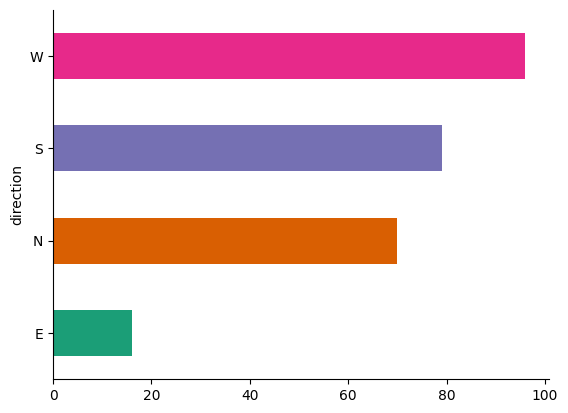

In [ ]:
# PLOT TO VISUALIZE MOST COMPLAINED REGISTERD FROM WHICH DIRECTION

from matplotlib import pyplot as plt
import seaborn as sns
df_working2_clean.groupby('direction').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

**Analyzing Different Types of CDPH Environmental Complaints**

In [ ]:

import plotly.express as px
# Assuming 'complaint_type' is the column with the types of complaints
if 'complaint_type' in df_working2_clean.columns:
    # Count the frequency of each type of complaint
    complaint_counts = df_working2_clean['complaint_type'].value_counts().reset_index()
    complaint_counts.columns = ['complaint_type', 'counts']  # Rename columns for clarity

    # Plotting the interactive pie chart
    fig = px.pie(complaint_counts, values='counts', names='complaint_type',
                 title='Distribution of Complaint Types',
                 hover_data=['counts'], labels={'complaint_type':'Complaint Type'})
    fig.update_traces(textposition='outside', textinfo='percent+label')

    # Increase the size of the chart
    fig.update_layout(width=1000, height=800)  # Adjust width and height as needed

    fig.show()
else:
    print("The column 'complaint_type' does not exist in the data. Please check the dataset.")

**CDPH Environmental Complaints HEAT MAP**

In [ ]:
#COMPLAINTS HEATMAP
import folium

from folium.plugins import HeatMap
#df = pd.read_json(source) #how can i use df cleaned?

df_whole = df_working2_clean.dropna(subset=['latitude','longitude']) #DF copy is causing many issues

display = folium.Map(location=(41.8781, -87.629), zoom_start=12) #chicago location


coords = df_whole[['latitude','longitude']].values.tolist()
#m = HeatMap(coords) #make the map object
HeatMap(coords).add_to(display) #add it to 'display'
display

**CHECKING THE COLUMN NAMES FOR BOTH DATA FRAME BEFORE MERGING THEM TOGETHER**

In [ ]:
print("PRINTING THE COLUMN NAMES FOR BOTH DATAFRAMES")
print(" \n")

print(" 1) Vacant & Abandoned Building Cleaned DF")
print(" \n")
print(df_cleaned_1.columns)

print(" \n")
print(" 2) CDPH Environmental Complaints Cleaned DF")
print(" \n")
print(df_working2_clean.columns)
print(" \n")

PRINTING THE COLUMN NAMES FOR BOTH DATAFRAMES
 

 1) Vacant & Abandoned Building Cleaned DF
 

Index(['docket_number', 'violation_number', 'issued_date',
       'issuing_department', 'last_hearing_date', 'property_address',
       'violation_type', 'entity_or_person_s_', 'disposition_description',
       'court_cost', 'total_paid', 'latitude', 'longitude', 'location', 'year',
       'Owner Type'],
      dtype='object')
 

 2) CDPH Environmental Complaints Cleaned DF
 

Index(['complaint_id', 'complaint_type', 'address', 'street_number',
       'direction', 'street_name', 'street_type', 'inspector',
       'complaint_date', 'modified_date', 'latitude', 'longitude'],
      dtype='object')
 



**MERGING DATASET**

1) Vacant & Abandoned Building

2) CDPH Environmental Complaints

In [ ]:
import pandas as pd

# NOTES -> CLEANED DATAFRAMES

# 1) Vacant & Abandoned Building
#
# df_cleaned_1

# 2) CDPH Environmental Complaints
#
# df_working2_clean


# Merging datasets
# df_merged = pd.merge(df_cleaned_1,df_working2_clean, on=['docket_number','violation_number','issued_date','issuing_department','property_address','violation_type','entity_or_person_s_',
 #                                                         'total_paid','latitude','longitude','year','complaint_id','complaint_type','address','street_number','direction','street_name','street_type','inspector','complaint_date','modified_date','latitude','longitude'],how='inner')

df_merged = pd.merge(df_cleaned_1,df_working2_clean, on=['latitude','longitude','latitude','longitude'],how='inner')

#df_merged.head()

print(" \n")
print("Validating the MERGE")
print(" \n")
print(df_merged.info())

 

Validating the MERGE
 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 0 entries
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   docket_number            0 non-null      object        
 1   violation_number         0 non-null      object        
 2   issued_date              0 non-null      datetime64[ns]
 3   issuing_department       0 non-null      object        
 4   last_hearing_date        0 non-null      object        
 5   property_address         0 non-null      object        
 6   violation_type           0 non-null      object        
 7   entity_or_person_s_      0 non-null      object        
 8   disposition_description  0 non-null      object        
 9   court_cost               0 non-null      float64       
 10  total_paid               0 non-null      float64       
 11  latitude                 0 non-null      float64       
 12  longitude            

In [ ]:
print(df_cleaned_1['violation_type'].unique())
print(df_working2_clean['complaint_type'].unique())

['13-12-125  Duty to secure and maintain vacant building.|13-12-140  Watchman required'
 '13-12-140  Watchman required'
 '13-12-140  Watchman required|13-12-140  Watchman required|13-12-140  Watchman required'
 '13-12-125  Duty to secure and maintain vacant building.|13-12-125  Duty to secure and maintain vacant building.|13-12-140  Watchman required|13-12-140  Watchman required'
 '13-12-140  Watchman required|13-12-140  Watchman required'
 '13-12-125  Duty to secure and maintain vacant building.'
 '13-12-125  Duty to secure and maintain vacant building.|13-12-125  Duty to secure and maintain vacant building.|13-12-140  Watchman required'
 '13-12-125  Duty to secure and maintain vacant building.|13-12-125  Duty to secure and maintain vacant building.|13-12-125  Duty to secure and maintain vacant building.'
 '7-24-099(a)     Cannabis - up to 15 grams'
 '13-12-125  Duty to secure and maintain vacant building.|13-12-125  Duty to secure and maintain vacant building.|13-12-125  Duty to secu

**MERGING THE DATASETS BY ISSUED_DATE AND COMPLAINT_DATE**

In [ ]:
df_cleaned_1['issued_date'] = pd.to_datetime(df_cleaned_1['issued_date'])
df_working2_clean['complaint_date'] = pd.to_datetime(df_working2_clean['complaint_date'])


df_merged_date = pd.merge_asof(df_cleaned_1.sort_values('issued_date'),
                               df_working2_clean.sort_values('complaint_date'),
                               left_on='issued_date', right_on='complaint_date',
                               direction='nearest')  # or use 'forward' or 'backward' depending on your data needs
#print(df_merged_date.head())
#print(df_merged_date.info())


<ipython-input-55-eeeac5b77c98>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



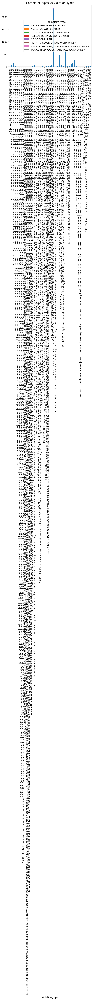

In [ ]:
import matplotlib.pyplot as plt

# Calculate the crosstab
ct = pd.crosstab(df_merged_date['violation_type'], df_merged_date['complaint_type'])

# Plot if there is data
if not ct.empty:
    ct.plot(kind='bar', stacked=True, title="Complaint Types vs Violation Types")
    plt.show()

else:
    print("No overlapping data available for plotting.")

**Trends in Violations and Complaints Over Time**

<ipython-input-57-5c87d18664e3>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



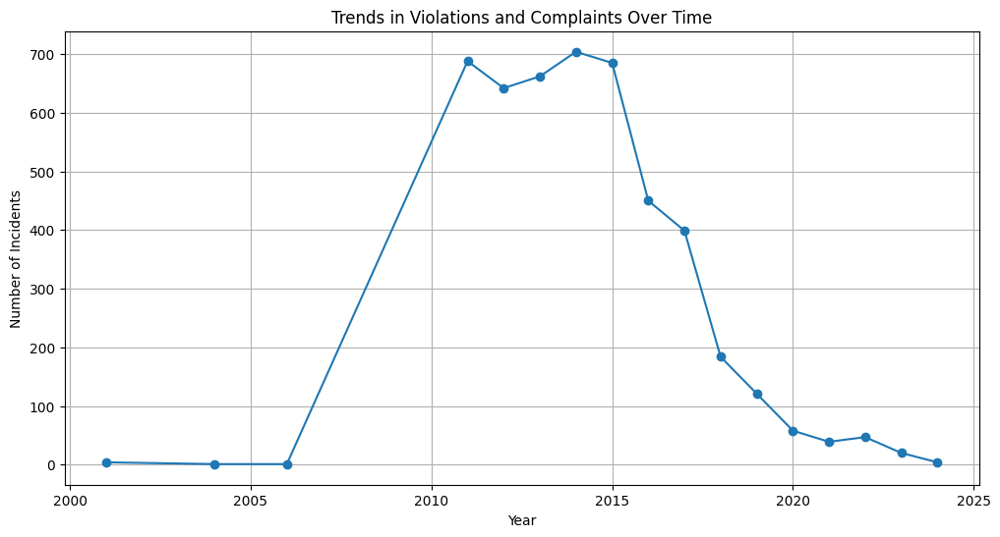

In [ ]:
df_cleaned_1['issued_date'] = df_working2_clean['complaint_date'].dt.year
time_series_data = df_merged_date.groupby('year').size()

plt.figure(figsize=(12, 6))
time_series_data.plot(kind='line', marker='o', linestyle='-')
plt.title('Trends in Violations and Complaints Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Incidents')
plt.grid(True)
plt.show()



**Visualize Correlations By combining Both Datasets into a OpenStreet Map**

In [ ]:
import folium
from folium.plugins import HeatMap
from folium.map import LayerControl, FeatureGroup
import matplotlib.cm as cm
import branca.colormap as bcm

df_cleaned_1.dropna(subset=['latitude', 'longitude'], inplace=True)
df_working2_clean.dropna(subset=['latitude', 'longitude'], inplace=True)

coords_df_cleaned_1 = df_cleaned_1[['latitude', 'longitude']].values.tolist()
coords_df_working2_clean = df_working2_clean[['latitude', 'longitude']].values.tolist()

# Initialize the map set the skin and zoom level
combined_map = folium.Map(location=(41.8780, -87.6298),zoom_start = 12,tiles="Cartodb Positron", width='100%', height='95%')

# Create feature groups for df_cleaned_1 and df_working2_clean
df_cleaned_1_control = FeatureGroup(name="Vacant & Abandoned Building")
df_working2_clean_control = FeatureGroup(name="CDPH Environmental Complaints")

#HeatMap(    coords_df_cleaned_1,     gradient={0.2: 'lightblue', 0.4: 'deepskyblue', 0.6: 'dodgerblue', 0.8: 'blue', 1: 'blue'}).add_to(df_cleaned_1_control)
#HeatMap(    coords_df_working2_clean,     gradient={0.2: 'orange', 0.4: 'coral', 0.6: 'tomato', 0.8: 'red', 1: 'red'}).add_to(df_working2_clean_control)

# Create color maps for "Viridis" and "Magma"
viridis = bcm.LinearColormap([cm.viridis(i) for i in range(256)], vmin=0.0, vmax=1.0)
magma = bcm.LinearColormap([cm.magma(i) for i in range(256)], vmin=0.0, vmax=1.0)

# Add heatmaps with new color maps
HeatMap(coords_df_cleaned_1, gradient={i: viridis(i) for i in [0.2, 0.4, 0.6, 0.8, 1]}).add_to(df_cleaned_1_control)
HeatMap(coords_df_working2_clean, gradient={i: magma(i) for i in [0.2, 0.4, 0.6, 0.8, 1]}).add_to(df_working2_clean_control)

# Add feature groups to the map
df_cleaned_1_control.add_to(combined_map)
df_working2_clean_control.add_to(combined_map)

# Add layer control to toggle visibility and opacity
LayerControl().add_to(combined_map)

legend_html = '''
<div style="position: fixed;
     top: 500px; right: 50px; width: 250px; height: 60px;
     border:2px solid grey; z-index:9999; font-size:14px;
     ">&nbsp; <br>
     &nbsp; Vacant & Abandoned Building &nbsp; &nbsp; &nbsp;<i style="background:#b5de2b; width:20px; height:10px; display:inline-block;"></i> <br>
     &nbsp; CDPH Environmental Complaints <i style="background:#fc8961; width:20px; height:10px; display:inline-block;"></i> <br>
</div>
''' #color palettes used are "Viridis" and "Magma"

# Add the legend to the map
combined_map.get_root().html.add_child(folium.Element(legend_html))

combined_map

<ipython-input-58-9ece16cb7c7a>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**MILESTONE 4 FINDINGS & SUMMERY**

Through comprehensive analysis of the CDPH Environmental Complaints dataset, several significant insights have emerged. Firstly, spatial distribution analysis revealed that the majority of complaints originate from the west (120%), followed by the south (90%), north (81%), and least from the east (19%) sides of the city. Secondly, categorization by complaint type depicted air pollution as the predominant issue (46%), followed by noise complaints (23%) and construction/demolition concerns (14.5%). Lastly, examination of correlation between Vacant & Abandoned Buildings and CDPH Environmental Complaints unveiled minimal association, suggesting other factors contribute more substantially to building abandonment. Surprisingly, there was minimal correlation between vacant buildings and environmental complaints, suggesting that other factors may contribute to building abandonment. Our visualizations, including bar graphs and pie charts, vividly illustrate these trends and provide valuable insights for urban planners and policymakers.


**Key Finding:**
The heatmap overlay of Vacant & Abandoned Building Violations and CDPH Environmental Complaints on OpenStreetMap revealed a surprising discovery. Despite expectations, there appears to be minimal correlation between these datasets, OpenStreetMap distinctly illustrates the limited correlation between Vacant & Abandoned Buildings and CDPH Environmental Complaints datasets. This suggests that environmental complaints may not be the primary driver of building abandonment in Chicago, challenging conventional assumptions about urban decay. Despite prevalent environmental concerns, such as air pollution and noise complaints, their impact on building abandonment remains negligible.

#**MILESTONE 5**

**THE FINAL CHAPTER**

The exploration into vacant and abandoned buildings in Chicago has been a journey of uncovering the city's urban landscape and its challenges. Leveraging a robust dataset provided by Chicago's Administrative Hearings and Finance Department, this project sought to dissect the complex narrative surrounding these neglected properties. Milestone 3 unearthed crucial insights, revealing a significant increase in vacant buildings post-2006, with corporate entities emerging as dominant property owners. Geospatial analysis pinpointed clusters of abandonment primarily in the west and south sides of Chicago, underscoring the socio-economic disparities exacerbating urban decay. These findings underscored the imperative for targeted interventions to mitigate the cascading effects of property abandonment on community well-being.


Transitioning to Milestone 4, the integration of the CDPH Environmental Complaints dataset expanded the scope of inquiry. This new dataset shed light on environmental concerns plaguing Chicago, ranging from air pollution to noise complaints. Spatial distribution analysis showcased a prevalence of complaints emanating from the west side, with air pollution emerging as the most prominent issue. However, the correlation analysis between vacant buildings and environmental complaints yielded surprising results minimal association was found, challenging preconceived notions about the drivers of urban decay. Visualizations, including bar graphs and pie charts, vividly depicted these trends, offering valuable insights for urban planners and policymakers.


The process involved in Milestone 4 encompassed meticulous data handling, from collection to cleaning and exploratory analysis. Addressing missing values, removing duplicates, and rectifying errors ensured the integrity of the analysis. Exploratory data analysis, characterized by the visualization of data using various techniques such as pie charts, bar graphs, and Folium's OpenStreet Heat Map, facilitated the extraction of meaningful insights. Documentation and reporting crystallized these findings into a coherent narrative, culminating in the unveiling of a paradigm-shifting revelation the limited correlation between environmental complaints and building abandonment.


Key findings from Milestone 4 challenged conventional wisdom, highlighting the nuanced dynamics shaping urban decay. Despite prevalent environmental concerns, their impact on building abandonment proved marginal, suggesting a more multifaceted interplay of factors. The heatmap overlay on OpenStreetMap starkly illustrated this divergence, reframing the discourse on urban decay in Chicago. This revelation underscores the need for holistic approaches to address the underlying socio-economic disparities fueling property abandonment.

In conclusion, the data mining journey through Chicago's vacant and abandoned buildings has been illuminating, revealing both the intricacies of urban decay and the limitations of conventional wisdom. From the proliferation of corporate-owned vacant properties to the surprising lack of correlation between environmental complaints and building abandonment, each milestone has deepened our understanding of the city's complex landscape. As we navigate the implications of these findings, the imperative remains clear to craft targeted interventions that address the root causes of urban decay and foster inclusive, resilient communities.